In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np 
import pandas as pd 
import collections
import torch
import json
import os
import cv2
import random
import gc
from tqdm import tqdm
import matplotlib.pyplot as plt
import PIL
from PIL import Image, ImageFile
from torch.utils.data import Dataset, DataLoader

from pathlib import Path

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [3]:
cfg = get_cfg()

# Merging model configs with default 
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model

# Get weights from Instance segmentation Mask RCNN R 50 FPN model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

predictor = DefaultPredictor(cfg)

In [4]:
# Create a list of images to sample random images from for visualization
images_list = []
for dirname, _, filenames in os.walk('data/raw/train/'):
    for filename in filenames:
        images_list.append(os.path.join(dirname, filename))

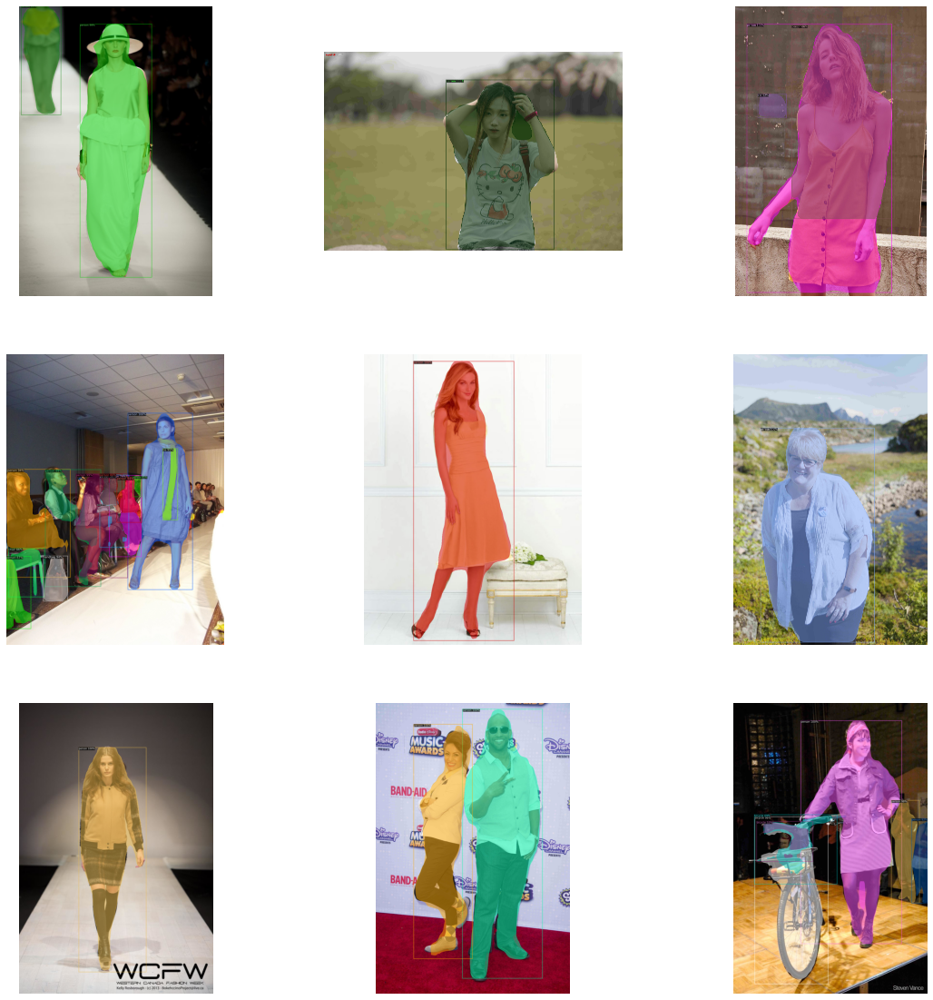

In [5]:
# Show different bboxes and images at random with preloaded weights 
rows, cols = 3, 3
plt.figure(figsize=(20,20))

for i, image in enumerate(random.sample(images_list, 9)):
    
    # Process image
    im = cv2.imread(image)
    plt.subplot(rows, cols, i+1)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    # Run through predictor
    outputs = predictor(im)
    
    # Visualize
    v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.axis('off')
    plt.imshow(v.get_image()[:, :, ::-1])

plt.show()

## Dataset

In [8]:
# Get training dataframe
data_dir = Path('data/raw')
image_dir = Path('data/raw/train/')
df = pd.read_csv(data_dir/'train.csv')

# Load modified df for Detectron2 dataset dict 
df_detectron = pd.read_csv('data/interim/df_detectron2.csv') 

# Get label descriptions
with open(data_dir/'label_descriptions.json', 'r') as file:
    label_desc = json.load(file)
df_categories = pd.DataFrame(label_desc['categories'])
df_attributes = pd.DataFrame(label_desc['attributes'])

In [34]:
# Rle helper functions

def rle_decode_string(rle, h, w):
    '''
    rle: run-length encoded image mask, as string
    h: heigh of image on which RLE was produced
    w: width of image on which RLE was produced
    returns a binary mask with the same shape
    '''
    mask = np.full(h*w, 0, dtype=np.uint8)
    annotation = [int(x) for x in rle.split(' ')]
    for i, start_pixel in enumerate(annotation[::2]):
        mask[start_pixel: start_pixel+annotation[2*i+1]] = 1
    mask = mask.reshape((h, w), order='F')

    return mask

def rle2bbox(rle, shape):
    '''
    Get a bbox from a mask which is required for Detectron 2 dataset
    rle: run-length encoded image mask, as string
    shape: (height, width) of image on which RLE was produced
    Returns (x0, y0, x1, y1) tuple describing the bounding box of the rle mask
    
    Note on image vs np.array dimensions:
    
        np.array implies the `[y, x]` indexing order in terms of image dimensions,
        so the variable on `shape[0]` is `y`, and the variable on the `shape[1]` is `x`,
        hence the result would be correct (x0,y0,x1,y1) in terms of image dimensions
        for RLE-encoded indices of np.array (which are produced by widely used kernels
        and are used in most kaggle competitions datasets)
    '''
    
    a = np.fromiter(rle.split(), dtype=np.uint)
    a = a.reshape((-1, 2))  # an array of (start, length) pairs
    a[:,0] -= 1  # `start` is 1-indexed
    
    y0 = a[:,0] % shape[0]
    y1 = y0 + a[:,1]
    if np.any(y1 > shape[0]):
        # got `y` overrun, meaning that there are a pixels in mask on 0 and shape[0] position
        y0 = 0
        y1 = shape[0]
    else:
        y0 = np.min(y0)
        y1 = np.max(y1)
    
    x0 = a[:,0] // shape[0]
    x1 = (a[:,0] + a[:,1]) // shape[0]
    x0 = np.min(x0)
    x1 = np.max(x1)
    
    if x1 > shape[1]:
        # just went out of the image dimensions
        raise ValueError("invalid RLE or image dimensions: x1=%d > shape[1]=%d" % (
            x1, shape[1]
        ))

    return x0, y0, x1, y1



### Create Detectron2 dataset dict

In [35]:
# Get image file path required for dict and add it to our dataframe
dirname = 'data/raw/train'
df_copy = df[:5000].copy() # df sample
df_copy['ImageId'] = dirname + '/' + df_copy['ImageId'] + '.jpg'

In [36]:
# Get bboxes for each mask with our helper function
bboxes = [rle2bbox(c.EncodedPixels, (c.Height, c.Width)) for n, c in df_copy.iterrows()]

In [37]:
# Turn list into array for proper indexing
bboxes_array = np.array(bboxes)

In [38]:
# Add each x, y coordinate as a column
df_copy['x0'], df_copy['y0'], df_copy['x1'], df_copy['y1'] = bboxes_array[:,0], bboxes_array[:,1], bboxes_array[:,2], bboxes_array[:,3]

In [39]:
df_copy.head()

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,x0,y0,x1,y1
0,data/raw/train/00000663ed1ff0c4e0132b9b9ac53f6...,6068157 7 6073371 20 6078584 34 6083797 48 608...,5214,3676,6,"115,136,143,154,230,295,316,317",1163,3923,2839,5213
1,data/raw/train/00000663ed1ff0c4e0132b9b9ac53f6...,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,"115,136,142,146,225,295,316,317",1212,1371,2394,3979
2,data/raw/train/00000663ed1ff0c4e0132b9b9ac53f6...,8521389 10 8526585 30 8531789 42 8537002 46 85...,5214,3676,28,163,1634,1371,2394,1892
3,data/raw/train/00000663ed1ff0c4e0132b9b9ac53f6...,12903854 2 12909064 7 12914275 10 12919485 15 ...,5214,3676,31,"160,204",2474,1827,3309,4603
4,data/raw/train/00000663ed1ff0c4e0132b9b9ac53f6...,10837337 5 10842542 14 10847746 24 10852951 33...,5214,3676,32,219,2078,2509,2577,2663


### Dataset dict function

In [44]:
# https://detectron2.readthedocs.io/tutorials/datasets.html
# https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5

from detectron2.structures import BoxMode
import pycocotools

def get_fashion_dict(df):
    
    dataset_dicts = []
    
    for idx, filename in enumerate(df['ImageId'].unique().tolist()):
        
        record = {}
        
        record['height'] = int(df[df['ImageId']==filename]['Height'].values[0])
        record['width'] = int(df[df['ImageId']==filename]['Width'].values[0])
        record['file_name'] = filename
        record['image_id'] = idx
        
        objs = []
        for index, row in df[(df['ImageId']==filename)].iterrows():
            
            # Get binary mask
            mask = rle_decode_string(row['EncodedPixels'], row['Height'], row['Width'])
            #mask = pycocotools.mask.encode(np.asarray(mask, order="F"))
            # Transform the mask from binary to polygon format
            contours, hierarchy = cv2.findContours((mask).astype(np.uint8), cv2.RETR_TREE,
                                                    cv2.CHAIN_APPROX_SIMPLE)                                            
            segmentation = []

            for contour in contours:
                contour = contour.flatten().tolist()
                # segmentation.append(contour)
                if len(contour) > 4:
                    segmentation.append(contour)    
            
            # Data for each mask
            obj = {
                'bbox': [row['x0'], row['y0'], row['x1'], row['y1']],
                'bbox_mode': BoxMode.XYXY_ABS,
                'category_id': row['ClassId'],
                'segmentation': segmentation,
                'iscrowd': 0
            }
            objs.append(obj)
        record['annotations'] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [45]:
# To view a sample of fashion_dict
fashion_dict = get_fashion_dict(df_detectron[:50])

In [46]:
fashion_dict[0]

{'height': 5214,
 'width': 3676,
 'file_name': 'data/raw/train/00000663ed1ff0c4e0132b9b9ac53f6e.jpg',
 'image_id': 0,
 'annotations': [{'bbox': [1163, 3923, 2839, 5213],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
   'category_id': 6,
   'segmentation': [[1372,
     3924,
     1372,
     3926,
     1371,
     3927,
     1371,
     3929,
     1370,
     3930,
     1370,
     3931,
     1369,
     3932,
     1369,
     3934,
     1368,
     3935,
     1368,
     3937,
     1367,
     3938,
     1367,
     3939,
     1366,
     3940,
     1366,
     3942,
     1365,
     3943,
     1365,
     3944,
     1364,
     3945,
     1364,
     3947,
     1363,
     3948,
     1363,
     3950,
     1362,
     3951,
     1362,
     3952,
     1361,
     3953,
     1361,
     3955,
     1360,
     3956,
     1360,
     3958,
     1359,
     3959,
     1359,
     3960,
     1358,
     3961,
     1358,
     3963,
     1357,
     3964,
     1357,
     3966,
     1356,
     3967,
     1356,
     3968,
     1

In [47]:
# Arbitrary split in training / testing dataframes
df_copy_train = df_detectron[:2000].copy()
df_copy_test = df_detectron[1000:].copy()

In [48]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# Register the train and test and set metadata
for d in ['train']:
    DatasetCatalog.register('sample_fashion_' + d, lambda d=df_copy_train: get_fashion_dict(d))
    MetadataCatalog.get("sample_fashion_" + d).set(thing_classes=list(df_categories.name))
fashion_metadata = MetadataCatalog.get("sample_fashion_train")

In [49]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# Register the train and test and set metadata
for d in ['test']:
    DatasetCatalog.register('sample_fashion_' + d, lambda d=df_copy_test: get_fashion_dict(d))
    MetadataCatalog.get("sample_fashion_" + d).set(thing_classes=list(df_categories.name))
fashion_metadata = MetadataCatalog.get("sample_fashion_test")

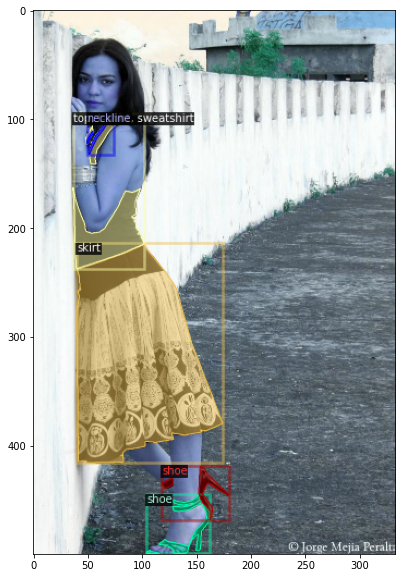

In [50]:
# View some images + masks from the dataset
import random
plt.figure(figsize=(10,10))
for d in random.sample(fashion_dict, 3):
    img = cv2.imread(d["file_name"])
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    visualizer = Visualizer(img[:, :, ::-1], fashion_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])

## Train

### Load et setup configs

In [51]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("sample_fashion_train",) # must be a tuple
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 1
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo

##### Input #####
# Set a smaller image size than default to avoid memory problems

# Size of the smallest side of the image during training
cfg.INPUT.MIN_SIZE_TRAIN = (600,)
# Maximum size of the side of the image during training
cfg.INPUT.MAX_SIZE_TRAIN = 900
# Size of the smallest side of the image during testing. Set to zero to disable resize in testing.
cfg.INPUT.MIN_SIZE_TEST = 600
# Maximum size of the side of the image during testing
cfg.INPUT.MAX_SIZE_TEST = 900

cfg.SOLVER.IMS_PER_BATCH = 1
cfg.SOLVER.BASE_LR = 0.00025  
cfg.SOLVER.MAX_ITER = 200    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # default: 512
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 46  # 46 classes in iMaterialist
# cfg.INPUT.MASK_FORMAT = "bitmask"

# Create new output_dir based on experience number
cfg.OUTPUT_DIR = "./output/exp03"

In [52]:
# Create output folder to dump all ouputs (tensorboard logs, model weigts, etc.)
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [53]:
trainer = DefaultTrainer(cfg) 

[04/29 15:11:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

[04/29 15:12:44 d2.data.build]: Removed 0 images with no usable annotations. 288 images left.
[04/29 15:12:44 d2.data.build]: Distribution of instances among all 46 categories:
|   category    | #instances   |   category    | #instances   |  category  | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:----------:|:-------------|
| shirt, blouse | 26           | top, t-shir.. | 103          |  sweater   | 12           |
|   cardigan    | 7            |    jacket     | 43           |    vest    | 3            |
|     pants     | 64           |    shorts     | 18           |   skirt    | 33           |
|     coat      | 21           |     dress     | 136          |  jumpsuit  | 1            |
|     cape      | 1            |    glasses    | 33           |    hat     | 18           |
| headband, h.. | 24           |      tie      | 6            |   glove    | 10           |
|     watch     | 22           |     belt      | 42           | leg warmer | 0         

In [54]:
# load weights
trainer.resume_or_load(resume=False)

In [55]:
# train loop
trainer.train()

[04/29 15:12:45 d2.engine.train_loop]: Starting training from iteration 0
[04/29 15:12:53 d2.utils.events]:  eta: 0:00:26  iter: 19  total_loss: 5.805  loss_cls: 3.830  loss_box_reg: 0.551  loss_mask: 0.692  loss_rpn_cls: 0.495  loss_rpn_loc: 0.073  time: 0.1697  data_time: 0.1049  lr: 0.000005  max_mem: 1415M
[04/29 15:12:59 d2.utils.events]:  eta: 0:00:24  iter: 39  total_loss: 5.402  loss_cls: 3.680  loss_box_reg: 0.369  loss_mask: 0.691  loss_rpn_cls: 0.408  loss_rpn_loc: 0.060  time: 0.2369  data_time: 0.1744  lr: 0.000010  max_mem: 1415M
[04/29 15:13:03 d2.utils.events]:  eta: 0:00:21  iter: 59  total_loss: 5.197  loss_cls: 3.422  loss_box_reg: 0.600  loss_mask: 0.691  loss_rpn_cls: 0.397  loss_rpn_loc: 0.087  time: 0.2249  data_time: 0.0602  lr: 0.000015  max_mem: 1415M
[04/29 15:13:07 d2.utils.events]:  eta: 0:00:18  iter: 79  total_loss: 4.726  loss_cls: 2.998  loss_box_reg: 0.451  loss_mask: 0.690  loss_rpn_cls: 0.451  loss_rpn_loc: 0.086  time: 0.2248  data_time: 0.0957  lr:

## Inference & evaluation using the trained model

First, we create a predictor using the model we just trained:

In [56]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ('sample_fashion_test',) # must be a tuple
predictor = DefaultPredictor(cfg)

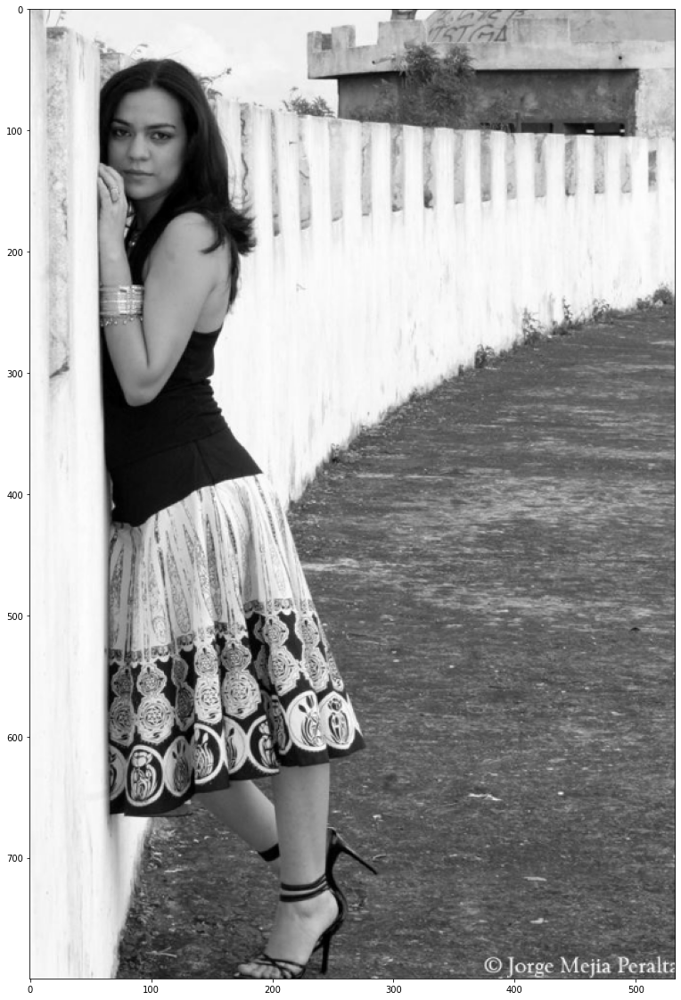

In [26]:
from detectron2.utils.visualizer import ColorMode
plt.figure(figsize=(20,20))
for d in random.sample(fashion_dict, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=fashion_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])

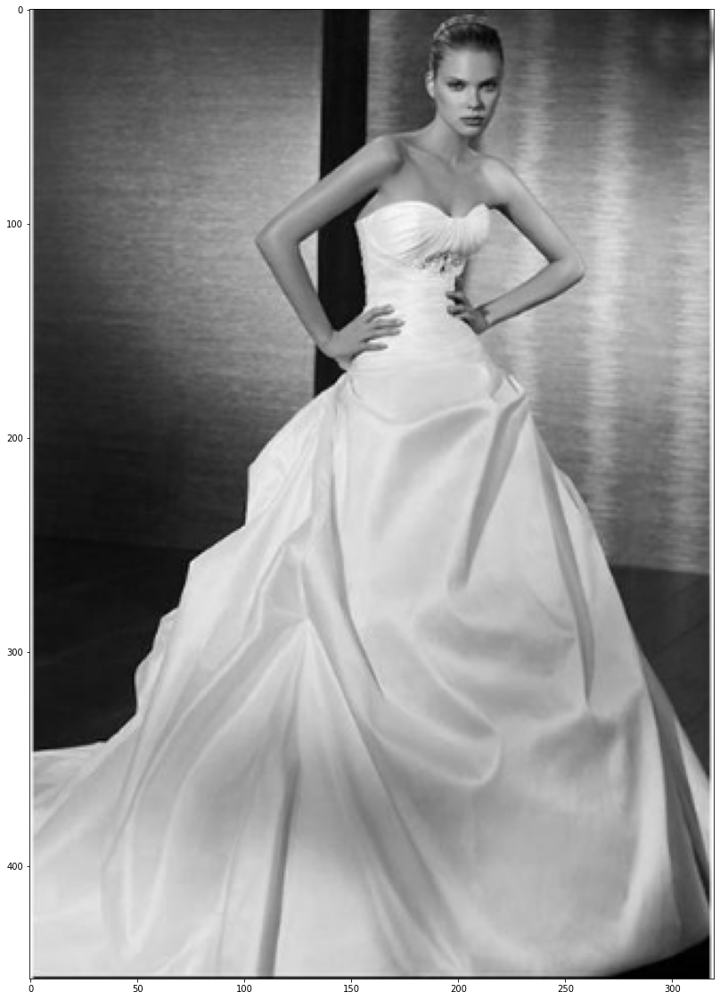

In [24]:
from detectron2.utils.visualizer import ColorMode
plt.figure(figsize=(20,20))
for d in random.sample(fashion_dict, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=fashion_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])

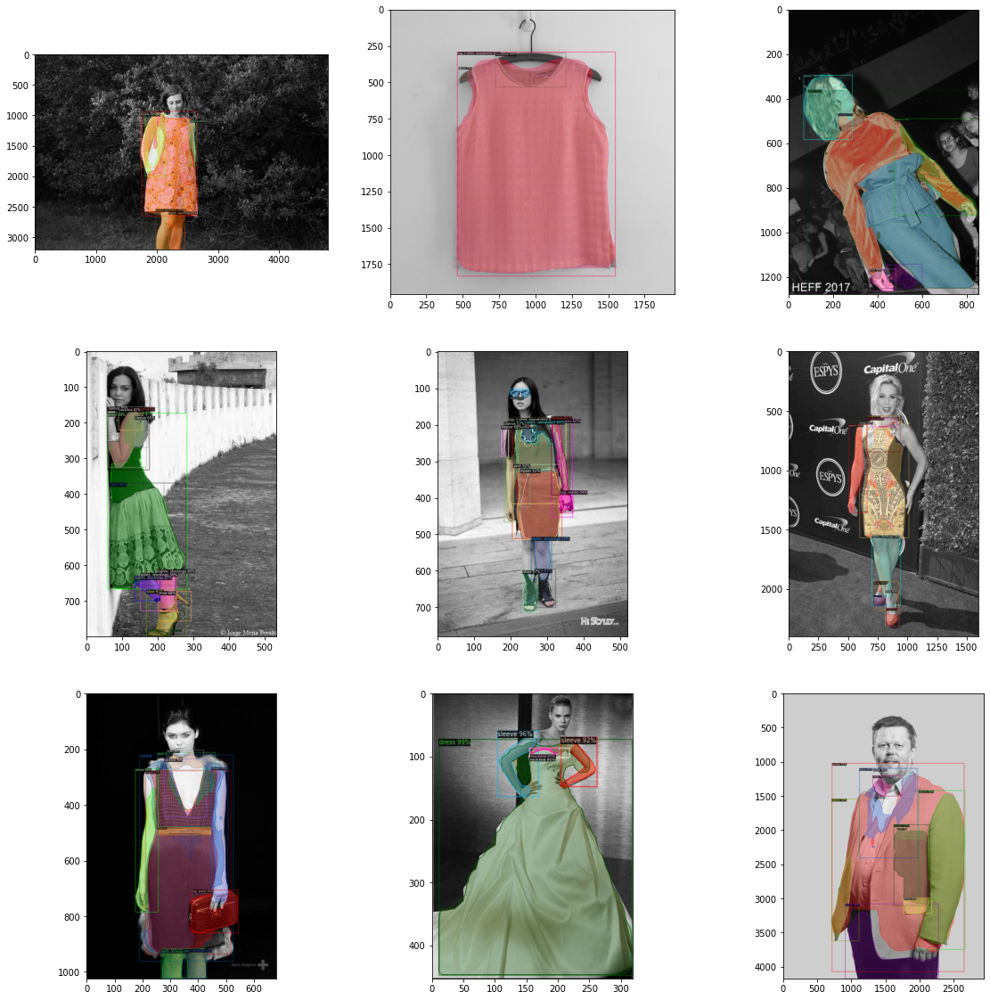

In [31]:
# Show different images at random
rows, cols = 3, 3
plt.figure(figsize=(20,20))

for i, d in enumerate(random.sample(fashion_dict, 9)):
    
    # Process image
    plt.subplot(rows, cols, i+1)

    im = cv2.imread(d["file_name"])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    # Run through predictor
    outputs = predictor(im)
    
    # Visualize
    v = Visualizer(im[:, :, ::-1],
                   metadata=fashion_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(v.get_image()[:, :, ::-1])

plt.show()

## Evaluate performance using AP metric implemented in COCO API

In [57]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("sample_fashion_test", cfg, False, output_dir="./output/exp03")

WARNING [04/29 15:13:41 d2.evaluation.coco_evaluation]: json_file was not found in MetaDataCatalog for 'sample_fashion_test'. Trying to convert it to COCO format ...
[04/29 15:13:41 d2.data.datasets.coco]: Converting dataset annotations in 'sample_fashion_test' to COCO format ...)
[04/29 17:40:52 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[04/29 17:42:45 d2.data.datasets.coco]: Conversion finished, num images: 45474, num annotations: 332401
[04/29 17:42:45 d2.data.datasets.coco]: Caching annotations in COCO format: ./output/exp03/sample_fashion_test_coco_format.json


In [ ]:
val_loader = build_detection_test_loader(cfg, "sample_fashion_test")

In [ ]:
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

In [35]:
import json

with open('output/exp03/sample_fashion_test_coco_format.json') as f:
    data = json.load(f)

In [37]:
data

{'info': {'date_created': '2020-04-27 23:39:39.053835',
  'description': 'Automatically generated COCO json file for Detectron2.'},
 'images': [{'id': 0,
   'width': 1168,
   'height': 1763,
   'file_name': 'data/raw/train/e6bc1f95d19224edabc8a19c7dfae13b.jpg'},
  {'id': 1,
   'width': 375,
   'height': 500,
   'file_name': 'data/raw/train/e6bdb3903732dc96008930b993c6ebec.jpg'},
  {'id': 2,
   'width': 1067,
   'height': 1600,
   'file_name': 'data/raw/train/e6bf3603640a083662d7a7ff799bf976.jpg'},
  {'id': 3,
   'width': 750,
   'height': 1241,
   'file_name': 'data/raw/train/e6c0b48e3cec1dcd10fbd6d344467fd2.jpg'},
  {'id': 4,
   'width': 1400,
   'height': 1400,
   'file_name': 'data/raw/train/e6c1029cef9bebc8946dca4544a027eb.jpg'},
  {'id': 5,
   'width': 2000,
   'height': 3000,
   'file_name': 'data/raw/train/e6c11aed2840017ea2c07710496306e0.jpg'},
  {'id': 6,
   'width': 1200,
   'height': 1600,
   'file_name': 'data/raw/train/e6c60fa7eccc2d0a79cdeb2410174d3e.jpg'},
  {'id': 7,
  